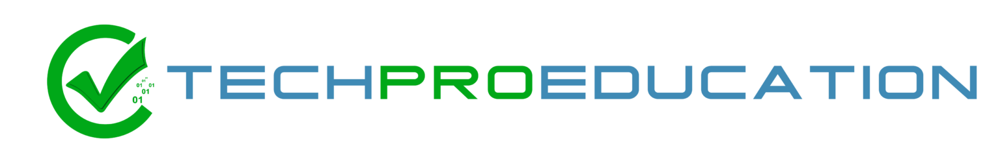

# Hand Written Digits Project

Data reference link : https://archive.ics.uci.edu/ml/datasets/Pen-Based+Recognition+of+Handwritten+Digits

# Exploratory Data Analysis and Visualization

In [1]:



import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#%matplotlib inline
#%matplotlib notebook
plt.rcParams["figure.figsize"] = (10,6)
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")
pd.set_option('display.float_format', lambda x: '%.3f' % x)


In [2]:
df=pd.read_csv("pendigits_txt.csv")

In [3]:
df.head(20)


,input1,input2,input3,input4,input5,input6,input7,input8,input9,input10,input11,input12,input13,input14,input15,input16,class
0,47,100,27,81,57,37,26,0,0,23,56,53,100,90,40,98,8
1,0,89,27,100,42,75,29,45,15,15,37,0,69,2,100,6,2
2,0,57,31,68,72,90,100,100,76,75,50,51,28,25,16,0,1
3,0,100,7,92,5,68,19,45,86,34,100,45,74,23,67,0,4
4,0,67,49,83,100,100,81,80,60,60,40,40,33,20,47,0,1
5,100,100,88,99,49,74,17,47,0,16,37,0,73,16,20,20,6
6,0,100,3,72,26,35,85,35,100,71,73,97,65,49,66,0,4
7,0,39,2,62,11,5,63,0,100,43,89,99,36,100,0,57,0
8,13,89,12,50,72,38,56,0,4,17,0,61,32,94,100,100,5
9,57,100,22,72,0,31,25,0,75,13,100,50,75,87,26,85,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10992 entries, 0 to 10991
Data columns (total 17 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   input1   10992 non-null  int64
 1   input2   10992 non-null  int64
 2   input3   10992 non-null  int64
 3   input4   10992 non-null  int64
 4   input5   10992 non-null  int64
 5   input6   10992 non-null  int64
 6   input7   10992 non-null  int64
 7   input8   10992 non-null  int64
 8   input9   10992 non-null  int64
 9   input10  10992 non-null  int64
 10  input11  10992 non-null  int64
 11  input12  10992 non-null  int64
 12  input13  10992 non-null  int64
 13  input14  10992 non-null  int64
 14  input15  10992 non-null  int64
 15  input16  10992 non-null  int64
 16  class    10992 non-null  int64
dtypes: int64(17)
memory usage: 1.4 MB


missing deger yok

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
input1,10992.000,38.814,34.258,0.000,6.000,32.000,65.000,100.000
input2,10992.000,85.120,16.219,0.000,76.000,89.000,100.000,100.000
input3,10992.000,40.606,26.343,0.000,20.000,40.000,58.000,100.000
input4,10992.000,83.774,19.164,0.000,72.000,91.000,100.000,100.000
input5,10992.000,49.770,34.101,0.000,18.000,53.000,78.000,100.000
input6,10992.000,65.573,26.997,0.000,49.000,71.000,86.000,100.000
input7,10992.000,51.220,30.577,0.000,28.000,53.500,74.000,100.000
input8,10992.000,44.499,29.906,0.000,23.000,43.000,64.000,100.000
input9,10992.000,56.869,34.136,0.000,29.000,60.000,89.000,100.000
input10,10992.000,33.696,27.252,0.000,7.000,33.000,54.000,100.000


Outlier yok diyebiliriz.


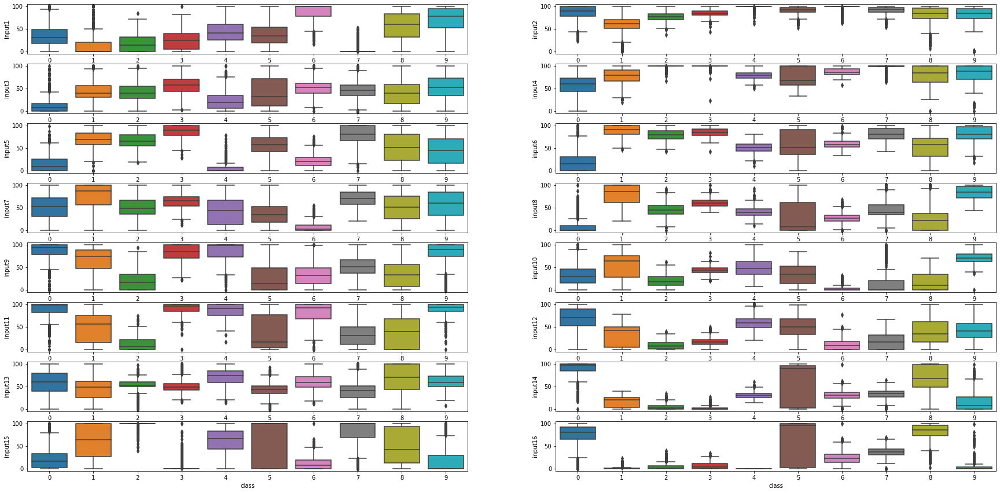

In [12]:
index = 0
plt.figure(figsize=(30,30))
for feature in df.columns:
    if feature != "class":
        index += 1
        plt.subplot(16,2,index)
        sns.boxplot(x='class',y=feature,data=df)

Outlier oldugu box gragihinde gozukuyor.

In [ ]:
sns.heatmap(df.corr(), annot=True)
plt.show()

input 14 ile 16 arasinda pozitif kuvvetli iliski var.
input 14 ile 16 arasinda pozitif kuvvetli iliski var.

<AxesSubplot:>

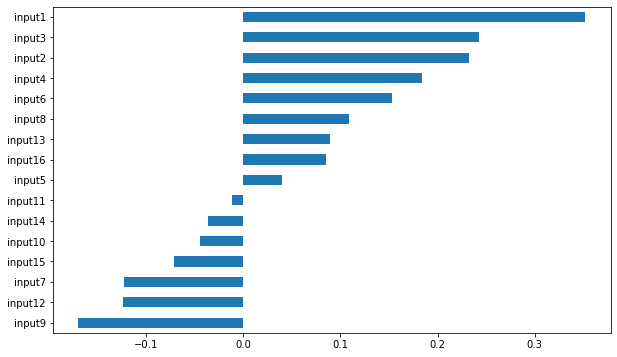

In [13]:
df.corr()["class"].drop("class").sort_values().plot.barh()

In [14]:
df.isnull().any()

input1     False
input2     False
input3     False
input4     False
input5     False
input6     False
input7     False
input8     False
input9     False
input10    False
input11    False
input12    False
input13    False
input14    False
input15    False
input16    False
class      False
dtype: bool

In [15]:
df["class"].value_counts()

2    1144
4    1144
1    1143
0    1143
7    1142
6    1056
8    1055
5    1055
9    1055
3    1055
Name: class, dtype: int64

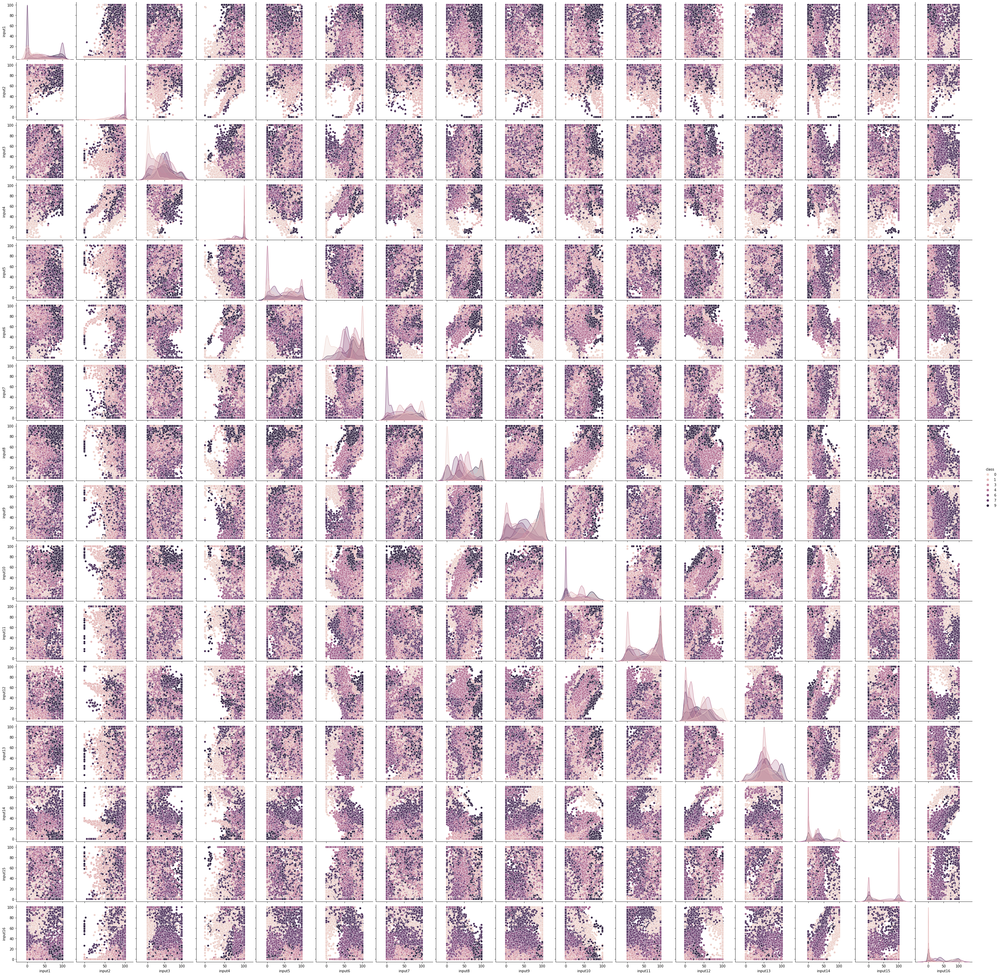

In [16]:
sns.pairplot(df, hue = "class")

In [ ]:
cok iyi ayrismamis

In [16]:
from sklearn.model_selection import train_test_split

In [17]:
X=df.drop(["class"], axis=1)
y=df["class"]

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

# Random Forest Classifier

In [29]:
from sklearn.metrics import confusion_matrix,classification_report,plot_confusion_matrix

def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [30]:
from sklearn.ensemble import RandomForestClassifier

In [31]:
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train,y_train)
eval_metric(rf_model, X_train, y_train, X_test, y_test)

Test_Set
[[132   0   0   0   0   0   0   0   0   0]
 [  0 115   2   0   1   0   0   0   0   0]
 [  0   0 118   0   0   0   0   0   0   0]
 [  0   0   0 108   0   0   0   0   0   0]
 [  0   0   0   0 115   0   0   0   0   0]
 [  0   0   0   0   0 105   0   0   0   0]
 [  0   0   0   0   0   0  98   0   0   0]
 [  0   0   0   0   0   0   0 108   0   1]
 [  0   0   0   0   0   0   0   1  97   0]
 [  0   0   0   0   0   0   0   1   0  98]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       132
           1       1.00      0.97      0.99       118
           2       0.98      1.00      0.99       118
           3       1.00      1.00      1.00       108
           4       0.99      1.00      1.00       115
           5       1.00      1.00      1.00       105
           6       1.00      1.00      1.00        98
           7       0.98      0.99      0.99       109
           8       1.00      0.99      0.99        98
           9       

In [5]:
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV

In [34]:
model = RandomForestClassifier(random_state=42)

scores = cross_validate(model, X_train, y_train, scoring = ["accuracy", "precision_micro", "recall_micro", "f1_micro"], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_accuracy          0.992
test_precision_micro   0.992
test_recall_micro      0.992
test_f1_micro          0.992
dtype: float64

Degerler uyumlu ve yuksek

In [35]:
rf_feature_imp = pd.DataFrame(index = X.columns, data = rf_model.feature_importances_,
                              columns = ["Feature Importance"]).sort_values("Feature Importance", ascending = False)
rf_feature_imp

,Feature Importance
input16,0.117
input14,0.103
input11,0.080
input15,0.076
input10,0.071
input5,0.071
input9,0.063
input1,0.059
input8,0.056
input2,0.056


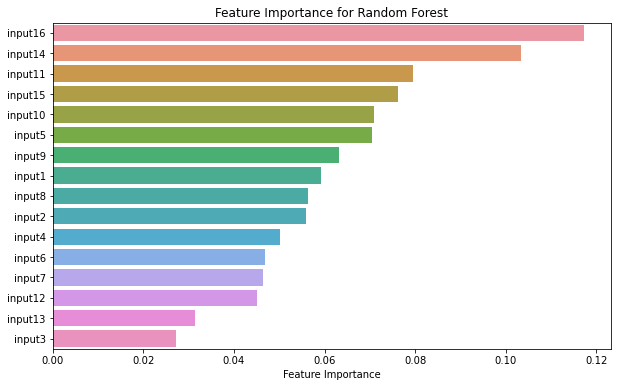

In [36]:
ax = sns.barplot(x=rf_feature_imp["Feature Importance"], y=rf_feature_imp.index)
plt.title("Feature Importance for Random Forest")
plt.show()

In [42]:
from sklearn.tree import plot_tree

def report_model(model):
    model_pred = model.predict(X_test)
    model_train_pred = model.predict(X_train)
    print('\n')
    print("Test Set")
    print(confusion_matrix(y_test, model_pred))
    print('\n')
    print(classification_report(y_test,model_pred))
    print('\n')
    print("Train Set")
    print(confusion_matrix(y_train, model_train_pred))
    print('\n')
    print(classification_report(y_train,model_train_pred))
    plt.figure(figsize=(12,8),dpi=100)
    plot_tree(model.estimators_[3], feature_names=X.columns, 
          class_names=df.class.unique(),
          filled = True,
          fontsize = 8);

SyntaxError: invalid syntax (2163298521.py, line 18)

In [43]:
pruned_tree = RandomForestClassifier()
pruned_tree.fit(X_train,y_train)

RandomForestClassifier()

In [ ]:
report_model(pruned_tree)

In [ ]:
param_grid = {'n_estimators':[50, 64, 100, 128, 500],     
             'max_features':[2, 3, 4, "auto"],
             'max_depth':[3, 5, 7, 9],
             'min_samples_split':[2, 5, 8]}

In [ ]:
model = RandomForestClassifier(class_weight = "balanced", random_state=42)
rf_grid_model = GridSearchCV(model, param_grid, scoring = "accuracy", n_jobs = -1, verbose = 2).fit(X_train, y_train)

In [44]:
rf_grid_model.best_params_

{'max_depth': 9,
 'max_features': 4,
 'min_samples_split': 2,
 'n_estimators': 500}

In [45]:
eval_metric(rf_grid_model, X_train, y_train, X_test, y_test)

Test_Set
[[131   0   0   0   0   0   0   0   1   0]
 [  0 112   5   0   1   0   0   0   0   0]
 [  0   1 117   0   0   0   0   0   0   0]
 [  0   0   0 108   0   0   0   0   0   0]
 [  0   0   0   0 115   0   0   0   0   0]
 [  0   0   0   0   0 104   0   0   0   1]
 [  0   0   0   0   0   0  98   0   0   0]
 [  0   1   0   0   0   0   0 108   0   0]
 [  0   0   0   0   0   0   0   2  96   0]
 [  0   0   0   0   1   0   0   1   0  97]]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       132
           1       0.98      0.95      0.97       118
           2       0.96      0.99      0.97       118
           3       1.00      1.00      1.00       108
           4       0.98      1.00      0.99       115
           5       1.00      0.99      1.00       105
           6       1.00      1.00      1.00        98
           7       0.97      0.99      0.98       109
           8       0.99      0.98      0.98        98
           9       

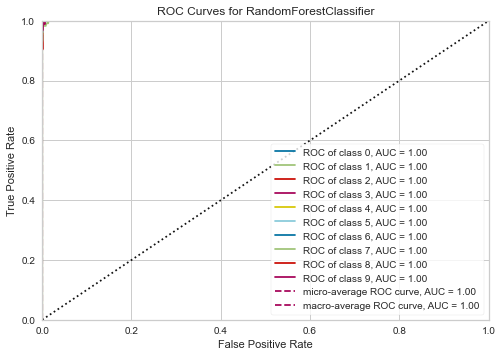

In [46]:
from yellowbrick.classifier import ROCAUC

rf_model = RandomForestClassifier()
visualizer = ROCAUC(rf_model)

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show();   

# Support Vector Machine (SVM) Classifier

In [19]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report,confusion_matrix

In [20]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [21]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

In [22]:
operations = [("scaler", StandardScaler()), ("SVC", SVC(random_state=42))]
pipe_model = Pipeline(steps=operations)

In [23]:
pipe_model.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('SVC', SVC(random_state=42))])

In [52]:
eval_metric(pipe_model, X_train, y_train, X_test, y_test)

Test_Set
[[131   0   0   0   0   0   0   0   1   0]
 [  0 116   1   0   1   0   0   0   0   0]
 [  0   0 118   0   0   0   0   0   0   0]
 [  0   0   0 108   0   0   0   0   0   0]
 [  0   0   0   0 115   0   0   0   0   0]
 [  0   0   0   0   0 105   0   0   0   0]
 [  0   0   0   0   0   0  98   0   0   0]
 [  0   0   0   0   0   0   0 109   0   0]
 [  0   0   0   0   0   0   0   1  97   0]
 [  0   0   0   0   0   0   0   1   0  98]]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       132
           1       1.00      0.98      0.99       118
           2       0.99      1.00      1.00       118
           3       1.00      1.00      1.00       108
           4       0.99      1.00      1.00       115
           5       1.00      1.00      1.00       105
           6       1.00      1.00      1.00        98
           7       0.98      1.00      0.99       109
           8       0.99      0.99      0.99        98
           9       

In [24]:
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate

In [25]:
operations = [("scaler", StandardScaler()), ("SVC", SVC(random_state=42))]
pipe_model = Pipeline(steps=operations)

scores = cross_validate(pipe_model, X_train, y_train, scoring = ['accuracy', 'precision','recall','f1'], cv = 5)
df_scores = pd.DataFrame(scores, index = range(1, 6))


In [26]:
df_scores

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1
1,0.882,0.613,NaN,NaN,NaN,NaN
2,0.928,0.440,NaN,NaN,NaN,NaN
3,0.910,0.432,NaN,NaN,NaN,NaN
4,0.877,0.408,NaN,NaN,NaN,NaN
5,0.871,0.424,NaN,NaN,NaN,NaN
6,1.160,0.440,NaN,NaN,NaN,NaN
7,0.881,0.424,NaN,NaN,NaN,NaN
8,0.880,0.425,NaN,NaN,NaN,NaN
9,0.896,0.425,NaN,NaN,NaN,NaN
10,0.882,0.409,NaN,NaN,NaN,NaN


In [35]:
from sklearn.model_selection import GridSearchCV

In [36]:
param_grid = {'SVC__C': [0.001, 0.05, 0.01, 0.1],
              'SVC__gamma': ["scale", "auto", 0.2, 0.3],
              'SVC__kernel': ['rbf', 'poly']}

In [37]:
operations = [("scaler", StandardScaler()), ("SVC", SVC(probability=True, class_weight="balanced", random_state=42))]
pipe_model = Pipeline(steps=operations)
svm_model_grid = GridSearchCV(pipe_model, param_grid, scoring="accuracy",n_jobs = -1, cv=5).fit(X_train, y_train)

In [ ]:
#svm_model_grid.fit(X_train, y_train)

In [38]:
svm_model_grid.best_params_

{'SVC__C': 0.05, 'SVC__gamma': 0.3, 'SVC__kernel': 'poly'}

In [39]:
svm_model_grid.best_score_

0.9951476856845206

In [40]:
eval_metric(svm_model_grid, X_train, y_train, X_test, y_test)

Test_Set
[[131   0   0   0   0   0   0   0   1   0]
 [  0 115   1   0   1   0   0   0   0   1]
 [  0   0 118   0   0   0   0   0   0   0]
 [  0   0   0 108   0   0   0   0   0   0]
 [  0   0   0   0 115   0   0   0   0   0]
 [  0   0   0   0   0 104   0   1   0   0]
 [  0   0   0   0   0   0  98   0   0   0]
 [  0   0   0   0   0   0   0 109   0   0]
 [  0   0   0   0   0   0   0   0  98   0]
 [  0   1   0   0   1   0   0   0   0  97]]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       132
           1       0.99      0.97      0.98       118
           2       0.99      1.00      1.00       118
           3       1.00      1.00      1.00       108
           4       0.98      1.00      0.99       115
           5       1.00      0.99      1.00       105
           6       1.00      1.00      1.00        98
           7       0.99      1.00      1.00       109
           8       0.99      1.00      0.99        98
           9       

In [41]:
operations = [("scaler", StandardScaler()), ("SVC", SVC(C= 0.05, gamma= 0.3, kernel= 'poly', probability=True,
                                                        class_weight="balanced", random_state=42))]
model = Pipeline(steps=operations)
scores = cross_validate(model, X_train, y_train, scoring = ['accuracy', 'precision','recall','f1'], cv = 5)
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

test_accuracy    NaN
test_precision   NaN
test_recall      NaN
test_f1          NaN
dtype: float64

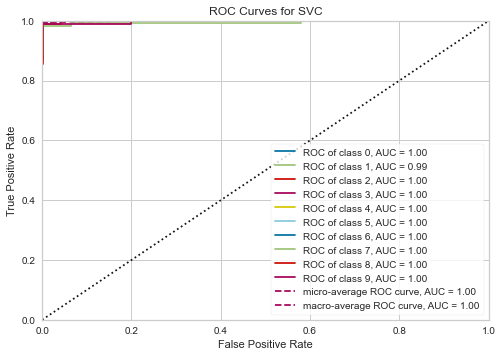

In [48]:
from yellowbrick.classifier import ROCAUC

rf_model = SVC()
visualizer = ROCAUC(rf_model)

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show();  

In [50]:
operations = [("scaler", StandardScaler()), ("SVC", SVC(probability=True, random_state=42))]
svc_basic_model = Pipeline(steps=operations)
svc_basic_model.fit(X_train, y_train)


Pipeline(steps=[('scaler', StandardScaler()),
                ('SVC', SVC(probability=True, random_state=42))])

In [52]:
y_pred_proba = svc_basic_model.predict_proba(X_train)
average_precision_score(y_train, y_pred_proba[:,1])

ValueError: multiclass format is not supported

In [54]:
precisions, recalls, thresholds = precision_recall_curve(y_train, y_pred_proba[:,1])

ValueError: multiclass format is not supported

In [55]:
optimal_idx = np.argmax((2 * precisions * recalls) / (precisions + recalls))
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

NameError: name 'precisions' is not defined

In [56]:
y_train_pred2 = pd.Series(svm_model_grid.predict_proba(X_train)[:,1]).apply(lambda x : 1 if x >= optimal_threshold else 0)
print(confusion_matrix(y_train, y_train_pred2))
print(classification_report(y_train, y_train_pred2))

NameError: name 'optimal_threshold' is not defined

In [ ]:
#%%CONCLUSION

In [ ]:
#Model olarak yanli sayisi  az oldugundan SVC secerdim.Lakin accuracy degerleri iki modelinde hemen hemen ayni.Random forest cok hizli calisti ve iyi degerler verdi. AUC degerlerinin hepsi 1 cikti.SVC bir sinif 1 den farkliydi.
Hiz onemli ise random forest tercih ederdim.SVC train 13 yanlis yapmis.Test 7 yanlis yapmis. Accuracy test degeri 0.99 train 1 oldugunu gormekteyiz. 
Random forest classification da tarin 76 test 14 hata yapmis. Accuracy test degeri train ve test datasinda 0.99 dur. 